In [1]:
import numpy as np
import cv2  # OpenCVライブラリ

import matplotlib.pyplot as plt 
%matplotlib inline

import torch

# infer

In [2]:
! ls weights

blazeface128_100.pth  blazeface128_40.pth    blazeface256_160.pth
blazeface128_10.pth   blazeface128_50.pth    blazeface256_170.pth
blazeface128_110.pth  blazeface128_60.pth    blazeface256_180.pth
blazeface128_120.pth  blazeface128_70.pth    blazeface256_190.pth
blazeface128_130.pth  blazeface128_80.pth    blazeface256_200.pth
blazeface128_140.pth  blazeface128_90.pth    blazeface256_20.pth
blazeface128_150.pth  blazeface128_best.pth  blazeface256_30.pth
blazeface128_160.pth  blazeface256_100.pth   blazeface256_40.pth
blazeface128_170.pth  blazeface256_10.pth    blazeface256_50.pth
blazeface128_180.pth  blazeface256_110.pth   blazeface256_60.pth
blazeface128_190.pth  blazeface256_120.pth   blazeface256_70.pth
blazeface128_200.pth  blazeface256_130.pth   blazeface256_80.pth
blazeface128_20.pth   blazeface256_140.pth   blazeface256_90.pth
blazeface128_30.pth   blazeface256_150.pth


In [3]:
from utils.blazeface import SSD256

voc_classes = ['person']

ssd_cfg = {
    'num_classes': 2,  # 背景クラスを含めた合計クラス数
    'input_size': 256,  # 画像の入力サイズ
    'bbox_aspect_num': [4, 6],  # 出力するDBoxのアスペクト比の種類
    'feature_maps': [16, 8],  # 各sourceの画像サイズ
    'steps': [8, 16],  # DBOXの大きさを決める
    'min_sizes': [16, 32],  # DBOXの大きさを決める
    'max_sizes': [32, 100],  # DBOXの大きさを決める
    'aspect_ratios': [[2], [2, 3], [2, 3], [2, 3], [2], [2]],
}

# SSDネットワークモデル
net = SSD256(phase="inference", cfg=ssd_cfg)

# SSDの学習済みの重みを設定
net_weights = torch.load('./weights/blazeface256_200.pth',
                         map_location={'cuda:0': 'cpu'})

net.load_state_dict(net_weights)

print('loaded the trained weights')


BlazeFace(
  (features): Sequential(
    (0): Conv2d(3, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): BlazeBlock(
      (conv1): Sequential(
        (0): Conv2d(24, 24, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2), groups=24)
        (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): Conv2d(24, 24, kernel_size=(1, 1), stride=(1, 1))
        (3): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (act): ReLU(inplace)
    )
    (4): BlazeBlock(
      (conv1): Sequential(
        (0): Conv2d(24, 24, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2), groups=24)
        (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): Conv2d(24, 24, kernel_size=(1, 1), stride=(1, 1))
        (3): BatchNorm2d(24, eps=1e-05, momentum=0.1, a

In [4]:
!ls sample

img2.png  img.png  sample.jpg


In [5]:
import cv2
image_file_path = "./sample/sample.jpg"
img = cv2.imread(image_file_path)  # [高さ][幅][色BGR]
img.shape

(183, 275, 3)

./sample/sample.jpg


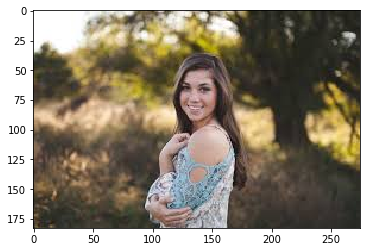

loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1406])
torch.Size([1, 2, 200, 5])
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1406])


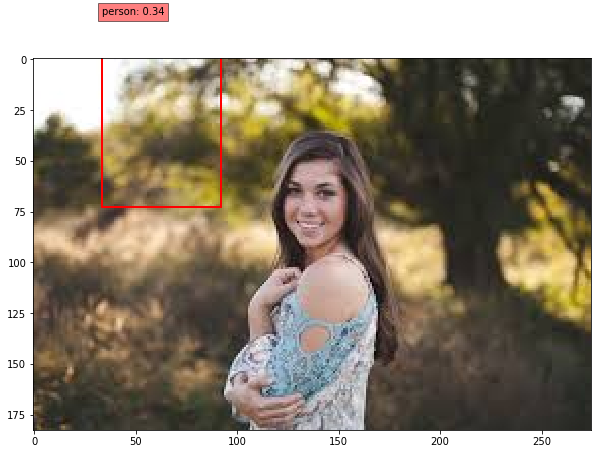

In [6]:
from utils.ssd_model import DataTransform
import glob
# 画像に対する予測
from utils.ssd_predict_show import SSDPredictShow
# 1. 画像読み込み
image_file_path = "./sample/sample.jpg"

ssd = SSDPredictShow(eval_categories=voc_classes, net=net, input_size=256)

for imp in glob.glob(image_file_path):
    print(imp)
    img = cv2.imread(imp)  # [高さ][幅][色BGR]
    height, width, channels = img.shape  # 画像のサイズを取得

    # 2. 元画像の表示
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

    # 3. 前処理クラスの作成
    color_mean = (104, 117, 123)  # (BGR)の色の平均値
    input_size = 256  # 画像のinputサイズを300×300にする
    transform = DataTransform(input_size, color_mean)

    # 4. 前処理
    phase = "val"
    img_transformed, boxes, labels = transform(img, phase, "", "")  # アノテーションはないので、""にする
    img = torch.from_numpy(img_transformed[:, :, (2, 1, 0)]).permute(2, 0, 1)

    # 5. SSDで予測
    net.eval()  # ネットワークを推論モードへ
    x = img.unsqueeze(0)  # ミニバッチ化：torch.Size([1, 3, 300, 300])
    detections = net(x)

    print(detections.shape)
    #print(detections)

    # output : torch.Size([batch_num, 21, 200, 5])
    #  =（batch_num、クラス、confのtop200、規格化されたBBoxの情報）
    #   規格化されたBBoxの情報（確信度、xmin, ymin, xmax, ymax）
    
    ssd.show(imp, data_confidence_level=0.3)



../VOCdevkit/VOC2007/JPEGImages/005629.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1407])


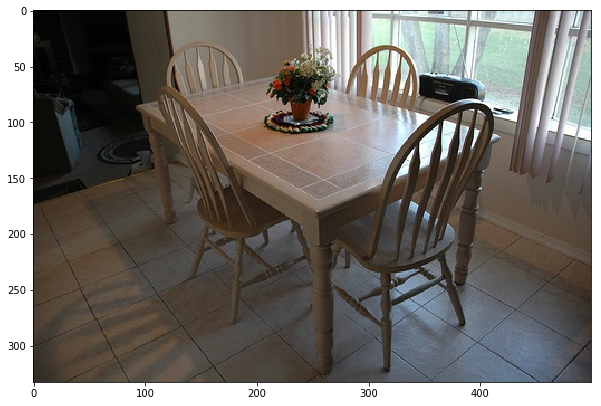

../VOCdevkit/VOC2007/JPEGImages/006519.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1407])


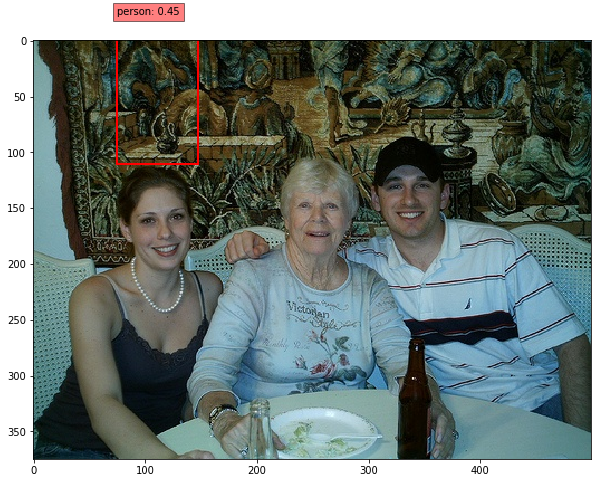

../VOCdevkit/VOC2007/JPEGImages/003017.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1408])


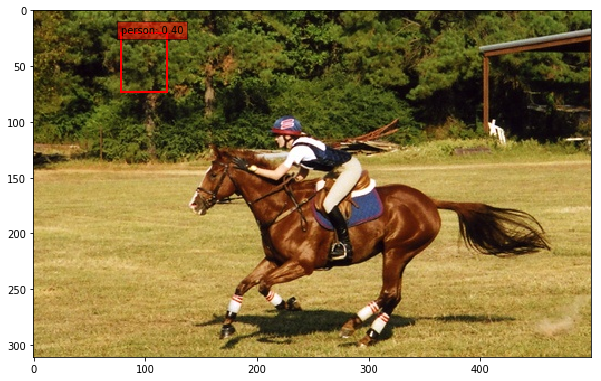

../VOCdevkit/VOC2007/JPEGImages/007454.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1403])


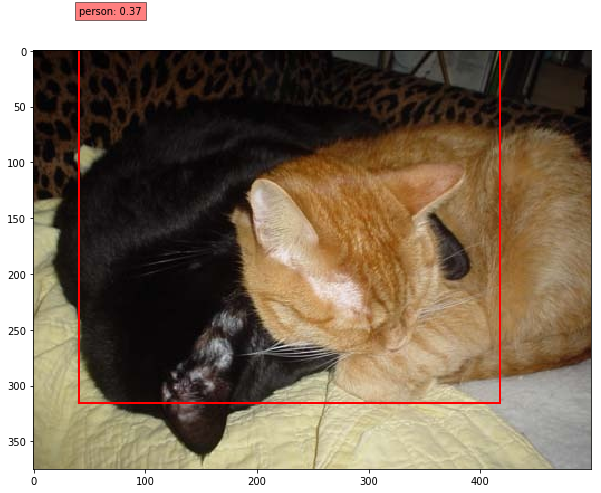

../VOCdevkit/VOC2007/JPEGImages/007074.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1407])


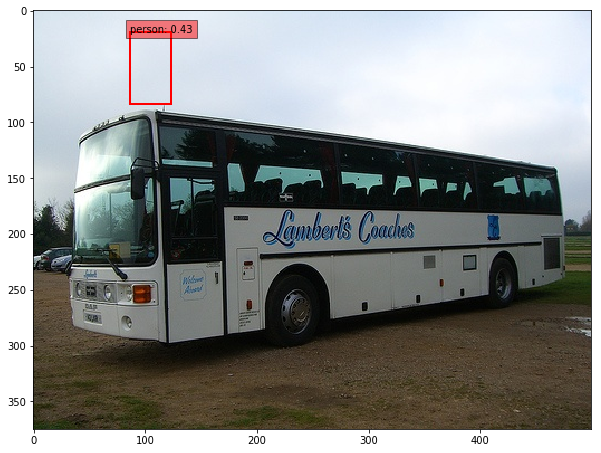

../VOCdevkit/VOC2007/JPEGImages/000680.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1408])


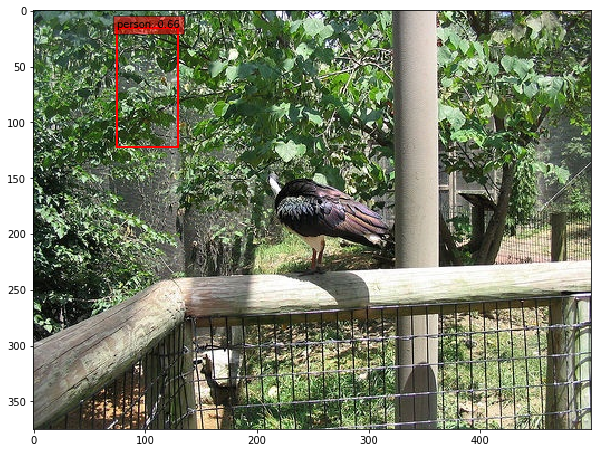

../VOCdevkit/VOC2007/JPEGImages/000460.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1398])


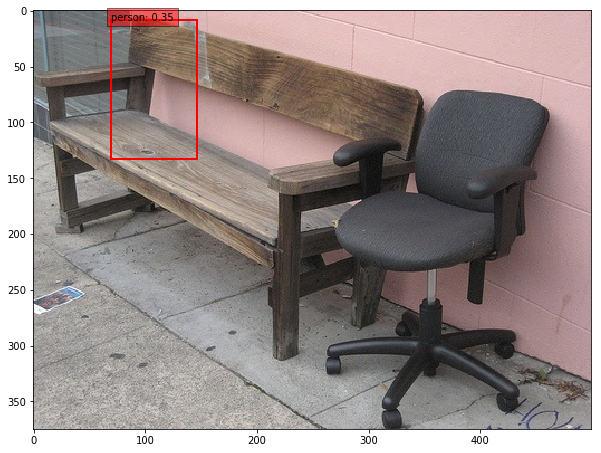

../VOCdevkit/VOC2007/JPEGImages/004622.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1402])


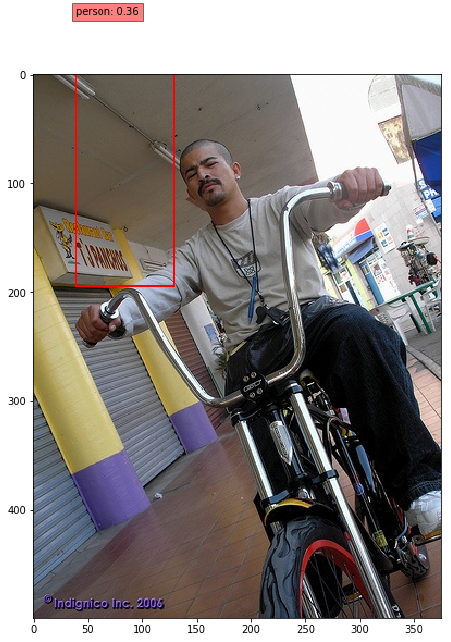

../VOCdevkit/VOC2007/JPEGImages/001281.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1406])


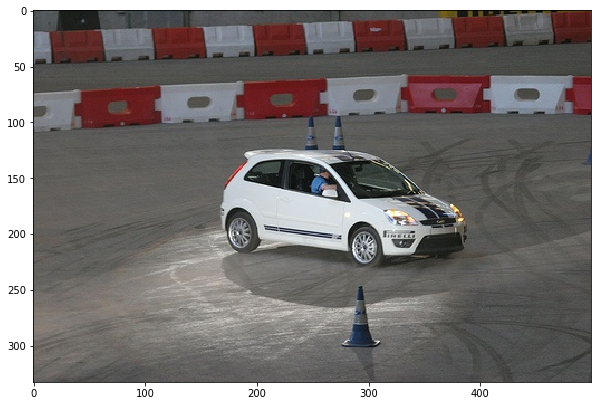

../VOCdevkit/VOC2007/JPEGImages/005497.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1398])


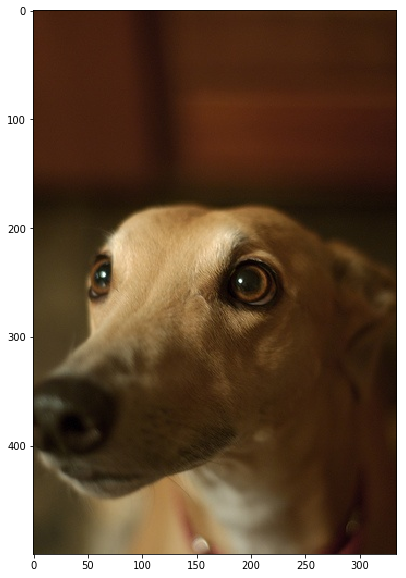

../VOCdevkit/VOC2007/JPEGImages/000042.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1407])


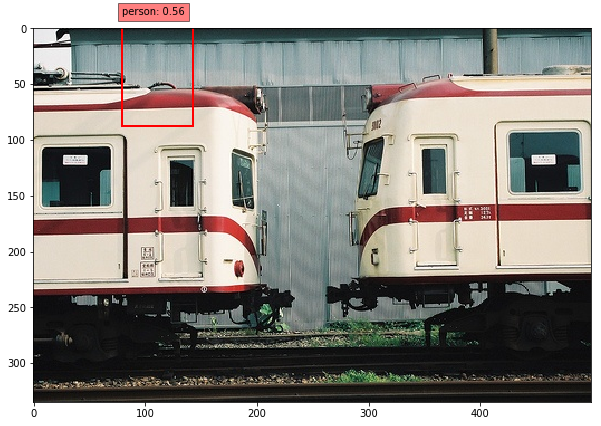

../VOCdevkit/VOC2007/JPEGImages/003077.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1400])


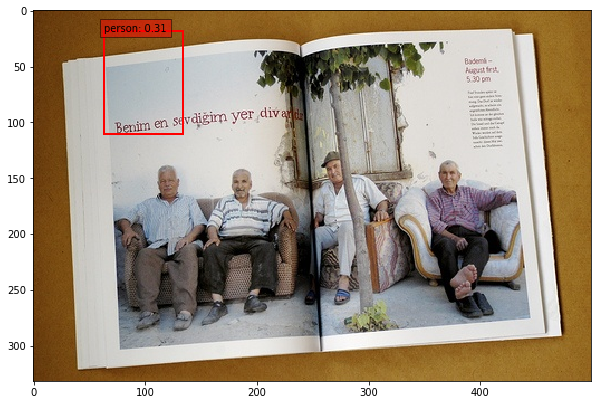

../VOCdevkit/VOC2007/JPEGImages/005637.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1408])


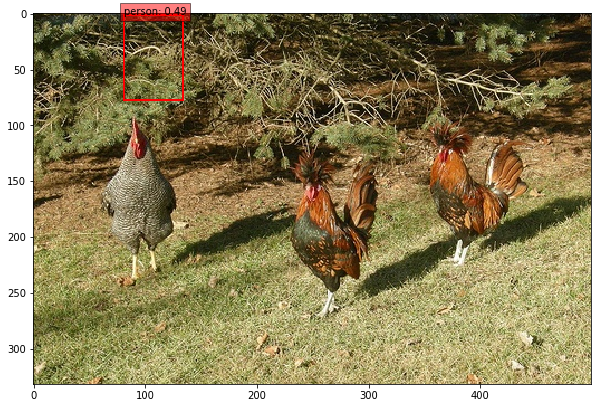

../VOCdevkit/VOC2007/JPEGImages/001498.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1397])


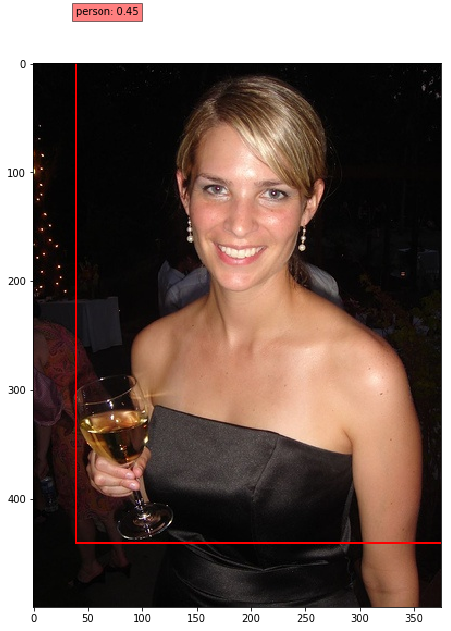

../VOCdevkit/VOC2007/JPEGImages/004939.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1408])


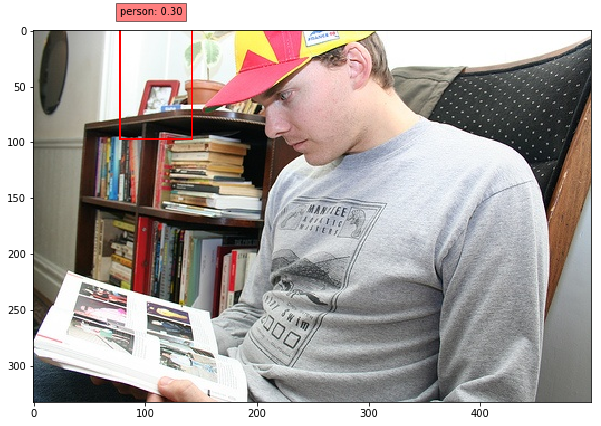

../VOCdevkit/VOC2007/JPEGImages/008749.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1407])


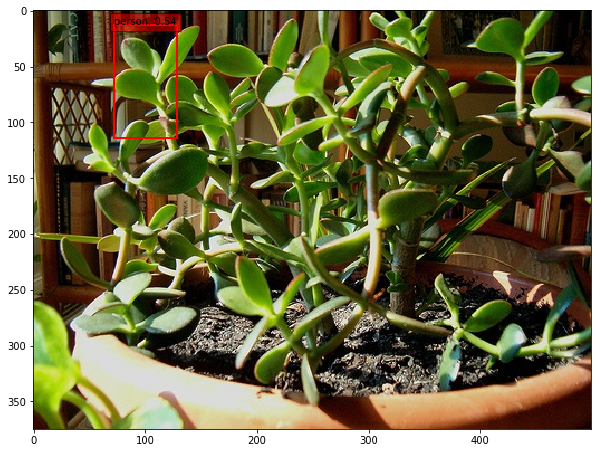

../VOCdevkit/VOC2007/JPEGImages/001143.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1407])


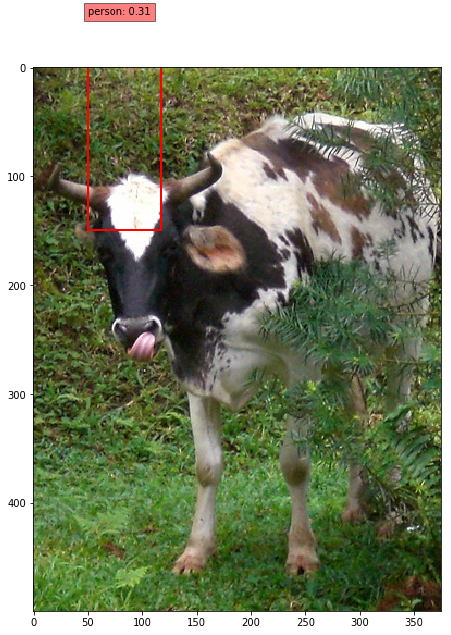

../VOCdevkit/VOC2007/JPEGImages/005885.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1406])


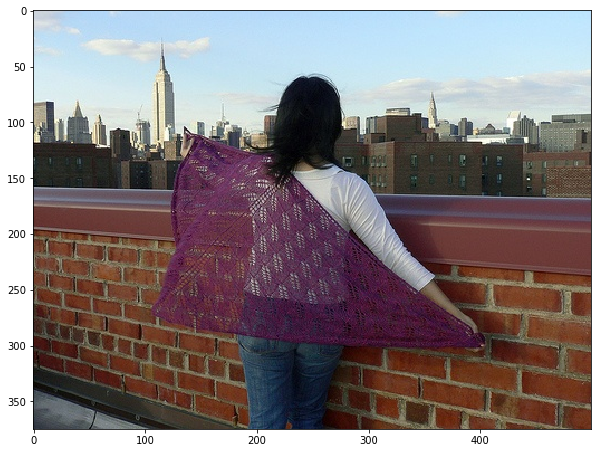

../VOCdevkit/VOC2007/JPEGImages/002114.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1392])


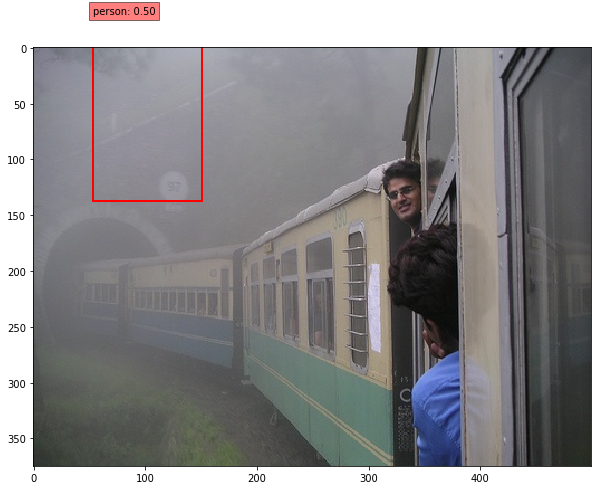

../VOCdevkit/VOC2007/JPEGImages/009200.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1395])


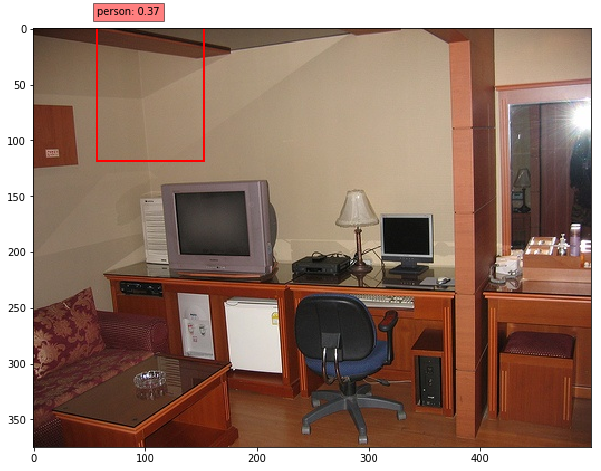

../VOCdevkit/VOC2007/JPEGImages/005815.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1408])


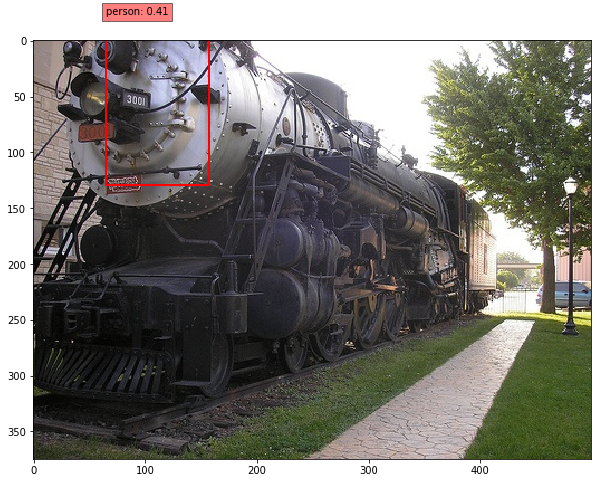

../VOCdevkit/VOC2007/JPEGImages/004322.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1405])


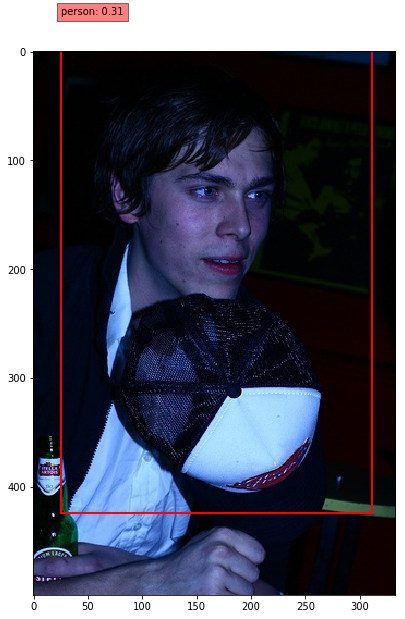

../VOCdevkit/VOC2007/JPEGImages/004792.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1404])


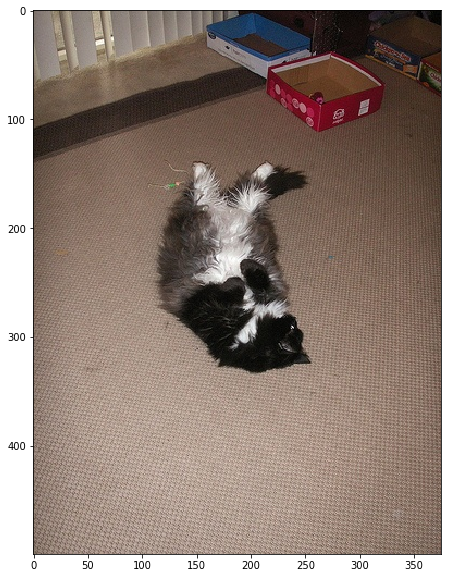

../VOCdevkit/VOC2007/JPEGImages/001457.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1404])


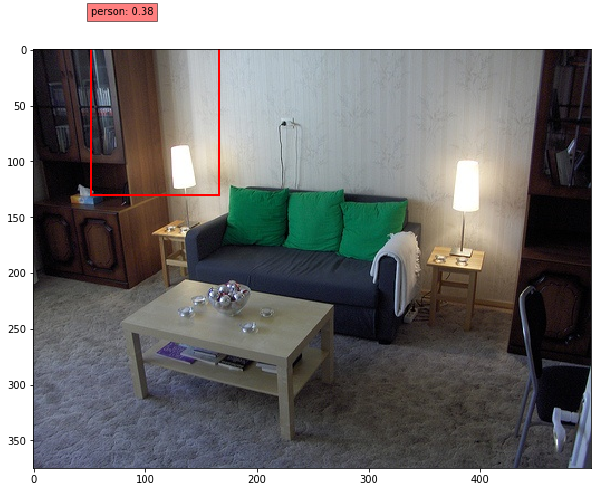

../VOCdevkit/VOC2007/JPEGImages/000519.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1406])


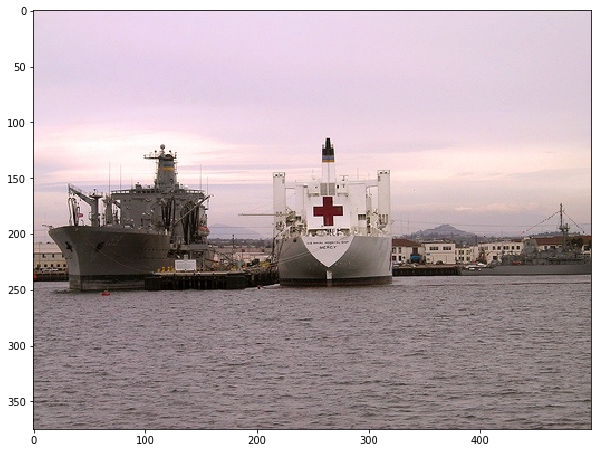

../VOCdevkit/VOC2007/JPEGImages/006462.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1398])


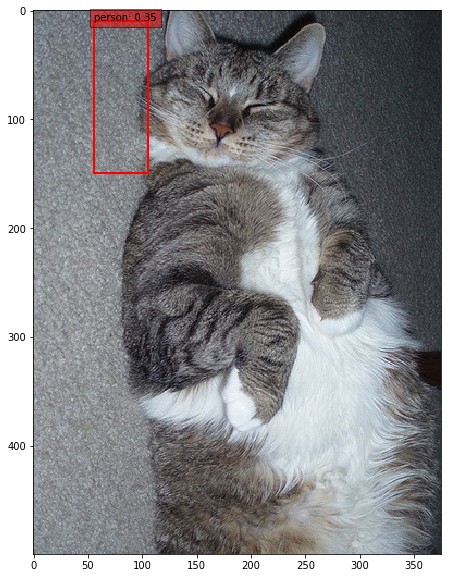

../VOCdevkit/VOC2007/JPEGImages/007311.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1405])


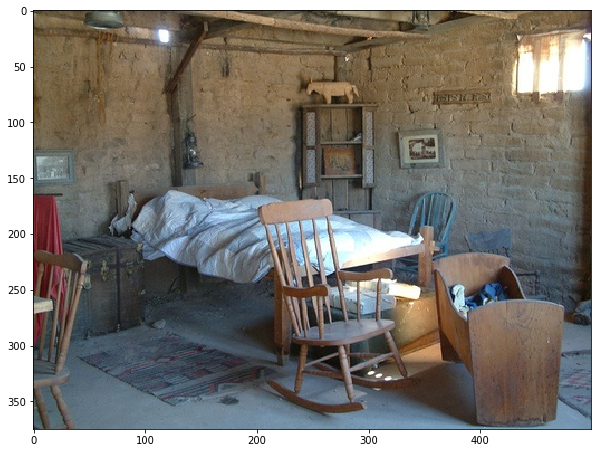

../VOCdevkit/VOC2007/JPEGImages/001184.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1407])


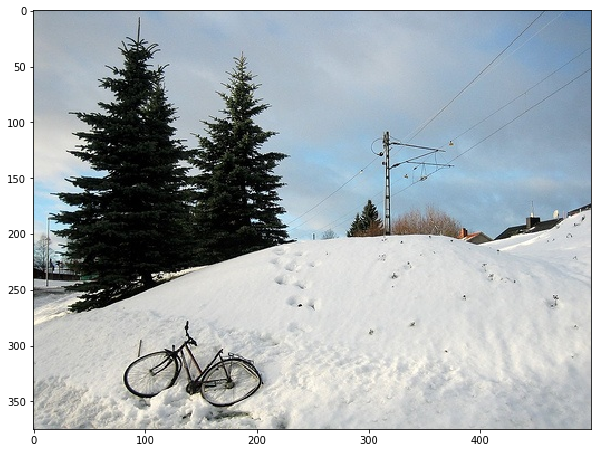

../VOCdevkit/VOC2007/JPEGImages/005414.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1408])


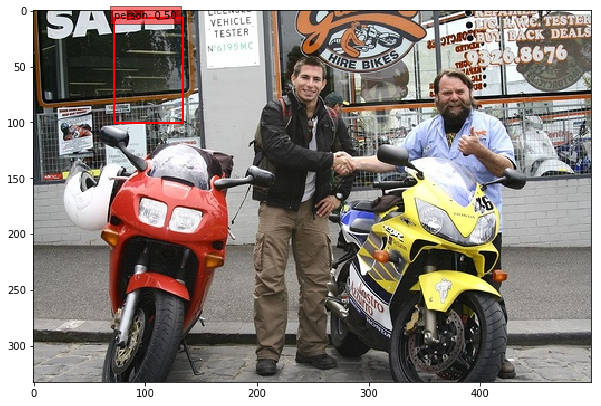

../VOCdevkit/VOC2007/JPEGImages/007878.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1407])


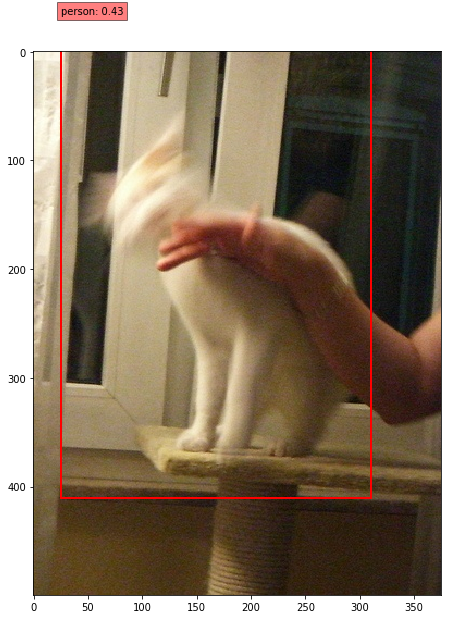

../VOCdevkit/VOC2007/JPEGImages/007833.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1397])


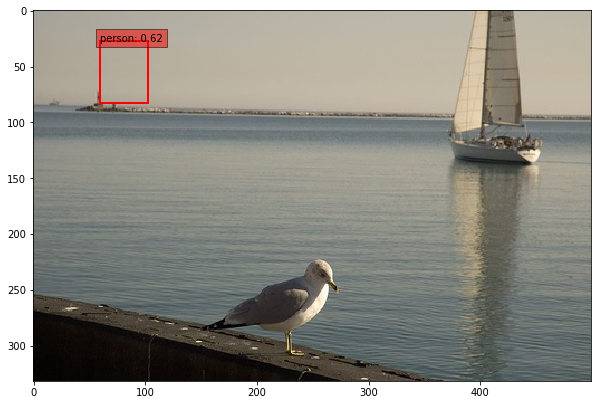

../VOCdevkit/VOC2007/JPEGImages/007149.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1403])


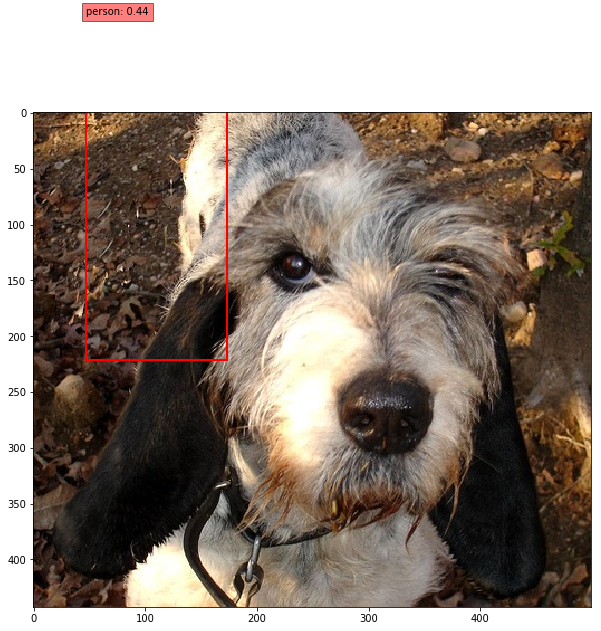

../VOCdevkit/VOC2007/JPEGImages/005259.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1406])


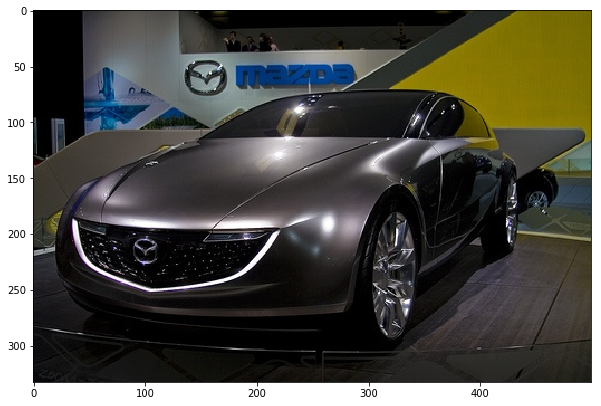

../VOCdevkit/VOC2007/JPEGImages/005861.jpg
loc torch.Size([1, 1408, 4])
box torch.Size([1408, 4])
torch.Size([1403])


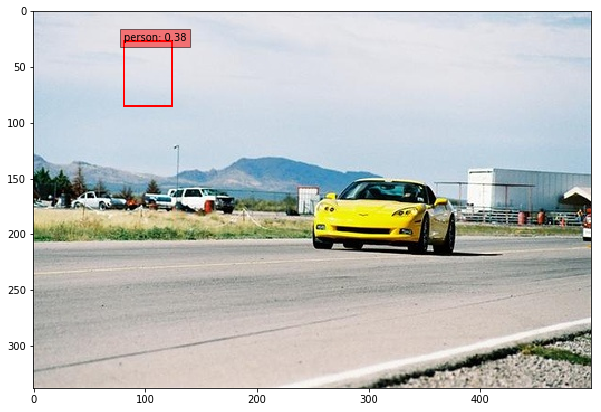

../VOCdevkit/VOC2007/JPEGImages/008747.jpg


In [ ]:
from utils.ssd_model import DataTransform
import glob
# 画像に対する予測
from utils.ssd_predict_show import SSDPredictShow
# 1. 画像読み込み
image_file_path = "../VOCdevkit/VOC2007/JPEGImages/*"

ssd = SSDPredictShow(eval_categories=voc_classes, net=net, input_size=256)

for imp in glob.glob(image_file_path)[:50]:
    print(imp)
    img = cv2.imread(imp)  # [高さ][幅][色BGR]
    height, width, channels = img.shape  # 画像のサイズを取得

    # 2. 元画像の表示
    #plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    #plt.show()
    
    ssd.show(imp, data_confidence_level=0.3)
    plt.show()
